|평가문항	|상세기준|
|:-|:-|
|1. base 모델을 활용한 Transfer learning이 성공적으로 진행되었는가?	|VGG16 등이 적절히 활용되었음|
|2. 학습과정 및 결과에 대한 설명이 시각화를 포함하여 체계적으로 진행되었는가?	|loss, accuracy 그래프 및 임의 사진 추론 결과가 제시됨|
|3. 분류모델의 test accuracy가 기준 이상 높게 나왔는가?	|test accuracy가 85% 이상 도달하였음|

In [1]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D, Dropout, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping

## Step 1. 데이터셋 내려받기  
- 이번에는 tensorflow_datasets 에 포함된 tf_flowers 데이터를 사용해 보겠습니다. tf_flowers 데이터에 대한 정보는 다음에서 확인해볼 수 있습니다.
- tfds.load를 활용하여 데이터셋을 다운받으세요.
https://www.tensorflow.org/datasets/catalog/tf_flowers


In [2]:
(ds_train, ds_validation, ds_test), metadata = tfds.load(
    'tf_flowers',
    split = ['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info = True,      # 데이터셋에 대한 정보를 함께 반환
    as_supervised = True   # 이미지와 레이블을 튜플 형태로 변환
)

Dl Completed...:   0%|          | 0/5 [00:00<?, ? file/s]

Dataset tf_flowers downloaded and prepared to /aiffel/tensorflow_datasets/tf_flowers/3.0.1. Subsequent calls will reuse this data.


In [3]:
# 데이터셋 확인
print(ds_train)
print(ds_validation)
print(ds_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


이미지의 크기가 각자 달라서 (None, None, 3) 형태로 출력된다.

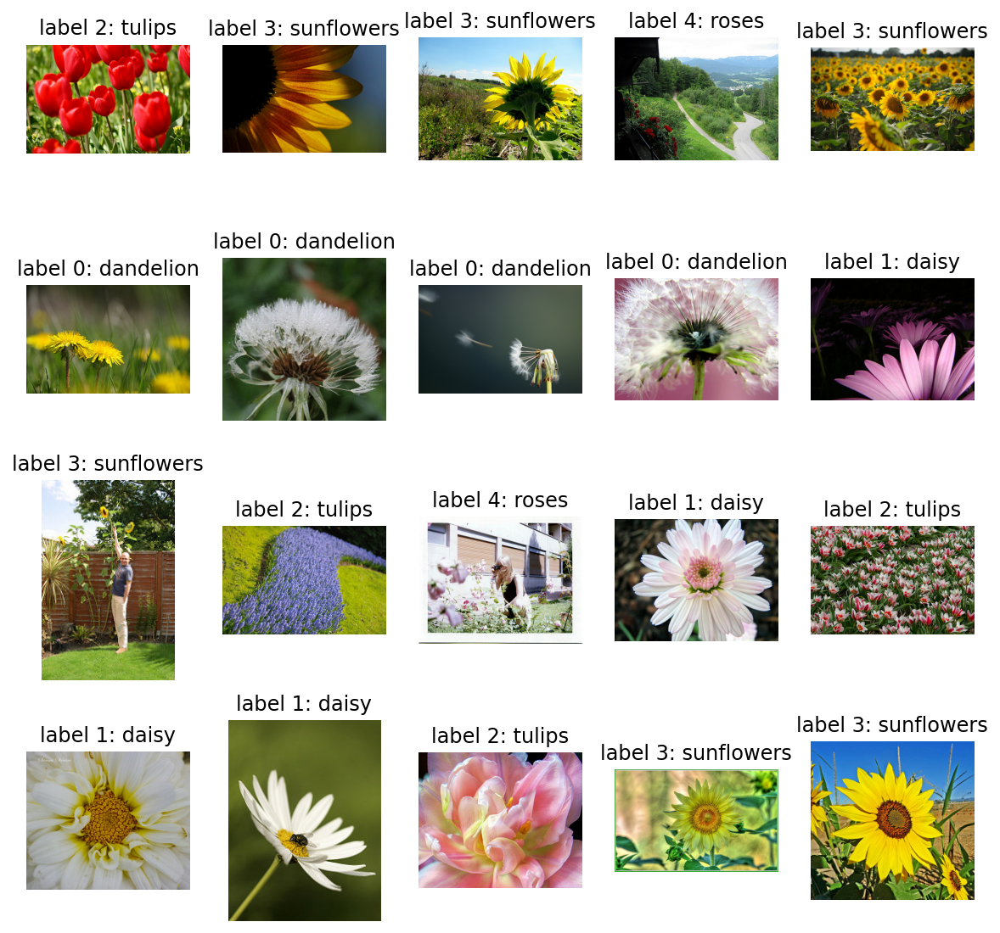

In [4]:
plt.figure(figsize=(10, 10))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(ds_train.take(20)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(4, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [5]:
metadata.features['label'].names

['dandelion', 'daisy', 'tulips', 'sunflowers', 'roses']

튤립, 해바라기, 장미, 민들레, 데이지 등에 다섯가지 꽃의 이미지 데이터들이 들어있다.
- 1: 데이지
- 2: 튤립
- 3: 해바라기
- 4: 장미
- 5: 민들레

## Step 2. 데이터셋을 모델에 넣을 수 있는 형태로 준비하기
- 이미지를 모두 같은 크기로 formatting 한 후,
- train_batches, validation_batches, test_batches를 준비합니다.

In [6]:
IMG_SIZE = 160 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의 텐서플로우 버전입니다.
    image = (image/127.5) - 1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

# format_example() 함수를 ds_train, ds_validation, ds_test 에 map() 함수로 적용시켜
# 원하는 모양의 train, validataion, test 데이터셋으로 변환

train = ds_train.map(format_example)
validation = ds_validation.map(format_example)
test = ds_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>


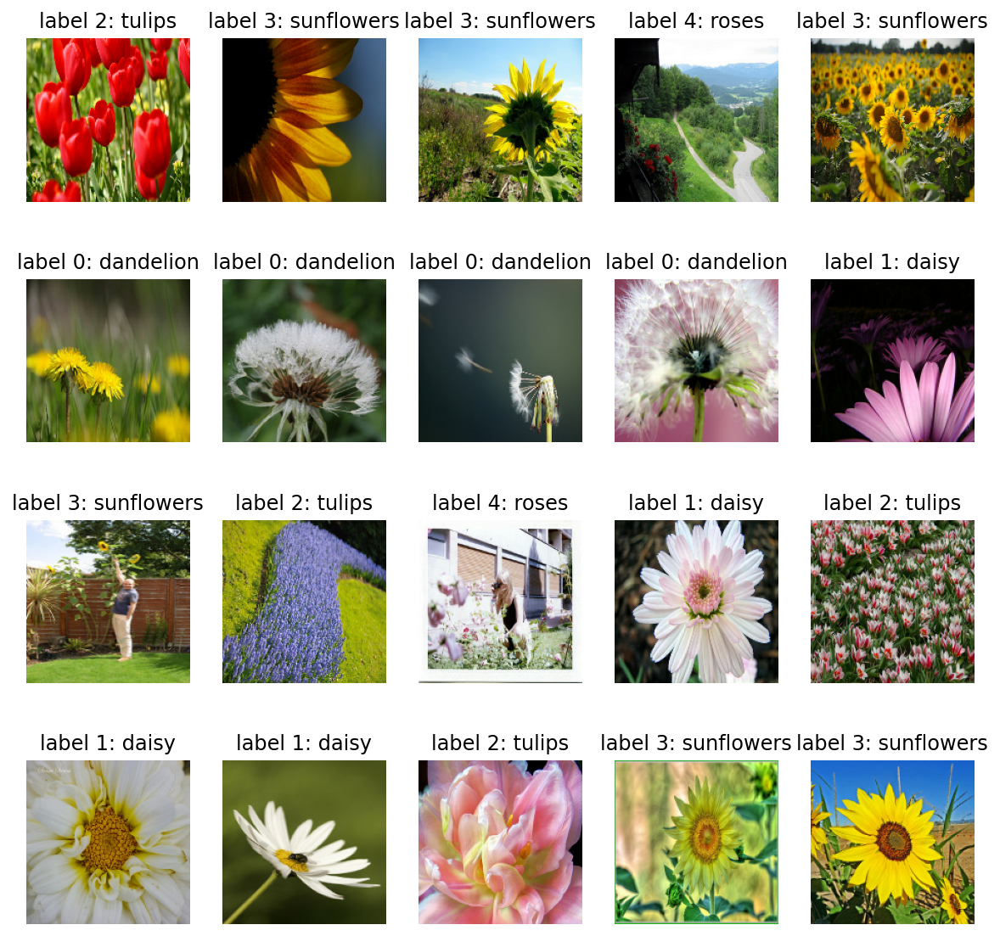

In [7]:
# 이미지가 리사이징 되었는지 확인

plt.figure(figsize=(10, 10))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(20)):
    plt.subplot(4, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

이미지가 모두 리사이징되었다.

In [8]:
# 모델 학습용 데이터 준비
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

# batch 데이터 형태 확인

for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

## Step 3-1. 모델 설계하기
## Step 4-1. 모델 학습시키기
## Step 5-1. 모델 성능 평가하기
직접 모델 설계하여 테스트, 학습, 성능평가

In [9]:
# 이전 프로젝트인 강아지, 고양이 분류할 때 만들었던 모델을 사용해보자.
model = Sequential([
    Conv2D(16, (3, 3), strides=1, activation='relu', padding='same', input_shape=(160, 160, 3)),
    BatchNormalization(),
    MaxPooling2D((2, 2)),
    Dropout(0.2),
    
    Conv2D(32, (3, 3), strides=1, activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D((2, 2)),
    Dropout(0.2),
    
    Conv2D(64, (3, 3), strides=1, activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D((2, 2)),
    Dropout(0.2),
    
    Flatten(),
    Dense(512, activation='relu', kernel_regularizer=l2(0.001)),  # Added L2 regularization
    Dense(5, activation='softmax')
])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 160, 160, 16)      448       
_________________________________________________________________
batch_normalization (BatchNo (None, 160, 160, 16)      64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 80, 80, 16)        0         
_________________________________________________________________
dropout (Dropout)            (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
batch_normalization_1 (Batch (None, 80, 80, 32)        128       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0

In [10]:
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [11]:
# 초기 모델 성능 확인
validation_steps = 10
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

10/10 [==============================] - 34s 25ms/step - loss: 2.6302 - accuracy: 0.2156
initial loss: 2.63
initial accuracy: 0.22


In [12]:
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)


EPOCHS = 50
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches,
                    callbacks=[early_stopping])

Epoch 1/50
92/92 [==============================] - 10s 52ms/step - loss: 3.2681 - accuracy: 0.4523 - val_loss: 5.9874 - val_accuracy: 0.2425
Epoch 2/50
92/92 [==============================] - 4s 36ms/step - loss: 2.0748 - accuracy: 0.5824 - val_loss: 9.6803 - val_accuracy: 0.2507
Epoch 3/50
92/92 [==============================] - 4s 36ms/step - loss: 1.7120 - accuracy: 0.6666 - val_loss: 9.1157 - val_accuracy: 0.2834
Epoch 4/50
92/92 [==============================] - 4s 36ms/step - loss: 1.4650 - accuracy: 0.7364 - val_loss: 7.1978 - val_accuracy: 0.3569
Epoch 5/50
92/92 [==============================] - 4s 35ms/step - loss: 1.2627 - accuracy: 0.8018 - val_loss: 6.4802 - val_accuracy: 0.4005
Epoch 6/50
92/92 [==============================] - 4s 36ms/step - loss: 1.1229 - accuracy: 0.8399 - val_loss: 5.1064 - val_accuracy: 0.4251
Epoch 7/50
92/92 [==============================] - 4s 35ms/step - loss: 1.0050 - accuracy: 0.8839 - val_loss: 4.4022 - val_accuracy: 0.5014
Epoch 8/50
9

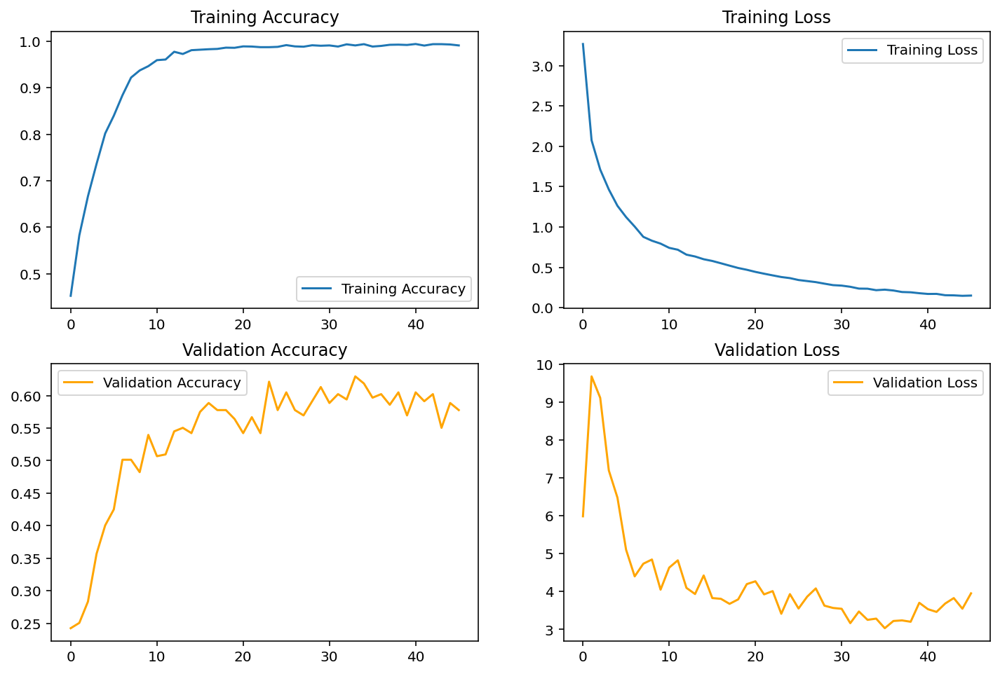

In [13]:
# 학습 단계에 따른 정확도 변화를 그래프로 확인
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

#epochs_range = range(EPOCHS)
#early_stopping 설정으로 인해 error가 발생해서 수정.
epochs_range = range(len(acc))

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)  
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.legend()
plt.title('Training Accuracy')

plt.subplot(2, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.legend()
plt.title('Training Loss')

plt.subplot(2, 2, 3)
plt.plot(epochs_range, val_acc, label='Validation Accuracy', color = 'orange')
plt.legend()
plt.title('Validation Accuracy')

plt.subplot(2, 2, 4)
plt.plot(epochs_range, val_loss, label='Validation Loss', color = 'orange')
plt.legend()
plt.title('Validation Loss')
plt.show()

학습은 잘 진행되고 있으나 val 데이터들이 매우 불안정

In [14]:
# 모델의 예측 결과 확인
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

array([[3.27525996e-02, 8.02123452e-07, 6.77533805e-01, 2.89710462e-01,
        2.29875900e-06],
       [1.00000000e+00, 2.23780505e-09, 6.90186475e-18, 2.74403210e-18,
        1.73326499e-15],
       [9.99999881e-01, 2.55597126e-08, 1.20749230e-10, 1.64126362e-07,
        9.56669119e-11],
       [7.76914123e-04, 9.93049860e-01, 1.82002099e-04, 4.96669031e-07,
        5.99070452e-03],
       [9.99992251e-01, 1.82554561e-06, 1.12112455e-11, 3.23326327e-12,
        5.99813347e-06],
       [8.13479722e-01, 1.64174326e-02, 1.68631032e-01, 6.08170114e-04,
        8.63535330e-04],
       [2.51598865e-01, 4.97416109e-02, 2.73244351e-01, 1.14017131e-03,
        4.24274981e-01],
       [9.92739022e-01, 7.02173170e-03, 1.11667259e-05, 4.81156690e-07,
        2.27746146e-04],
       [1.87558624e-06, 6.39249450e-13, 4.94745145e-05, 9.99948502e-01,
        1.65154631e-07],
       [1.00000000e+00, 1.28692543e-12, 1.87815946e-20, 8.65915661e-18,
        5.32217059e-14],
       [1.00000000e+00, 4.5562

In [15]:
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 1, 0, 0, 4, 0, 3, 0, 0, 0, 3, 4, 4, 3, 2, 0, 0, 0, 4, 0,
       1, 0, 0, 0, 2, 0, 2, 0, 0, 0])

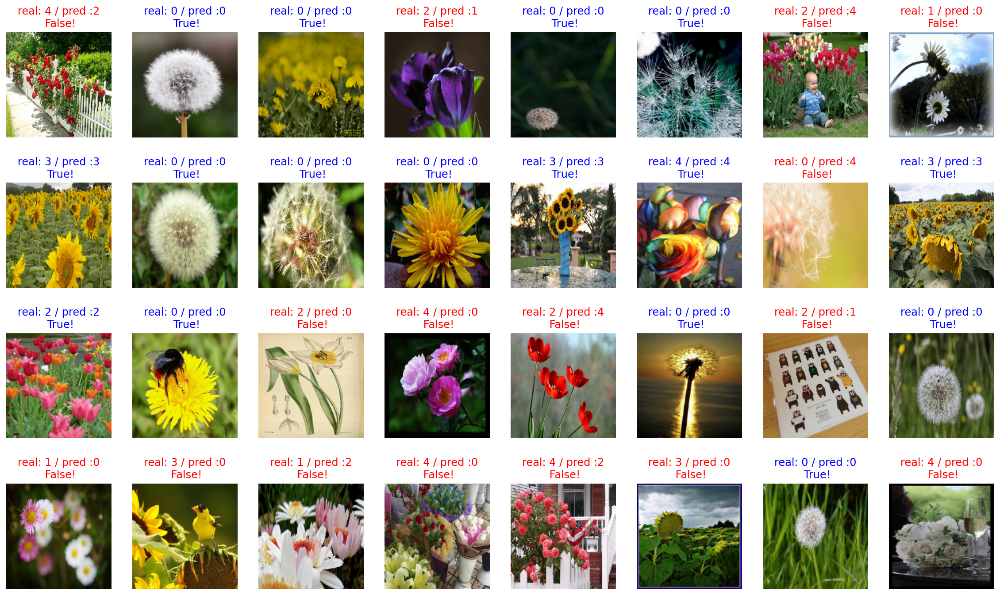

In [16]:
# 32장의 image들과 32개의 label, 그리고 32개의 prediction 각각을 시각화해서 확인
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [17]:
# 위 32개 이미지에 대한 예측(prediction)의 정확도(accuracy)

count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100)

50.0


약 65% 정도를 맞추고 있는 것을 알 수 있다.

## Step 3-2. 모델 설계하기
## Step 4-2. 모델 학습시키기
## Step 5-2. 모델 성능 평가하기
### [pre-trained 모델 사용 (VGG16)]

In [18]:
# VGG 모델을 base_model의 변수로 불러오기
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

58900480/58889256 [==============================] - 0s 0us/step


In [19]:
# 기존 이미지 batch size
image_batch.shape

TensorShape([32, 160, 160, 3])

In [20]:
# 불러온 pre-trained model에 대해 이미지를 넣어 확인
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [21]:
# 모델 구조 확인
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

In [22]:
# Global Average Pooling 계층 만들기
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

# global_average_layer에 위에서 VGG16이 출력했던 feature_batch를 입력
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [23]:
# 마지막에 Dense 레이어들을 추가하여 classifier 완성
# dense layer에는 unit과 activation 2개의 매개변수만 사용해주세요.
# unit의 값은 위에서 global_average_layer를 통과했을 때의 값을 생각해보세요.
# 활성화 함수는 ReLU를 사용합니다.
dense_layer = Dense(units=512, activation='relu')
# unit은 우리가 분류하고 싶은 class를 생각해보세요.
# 활성화 함수는 Softmax를 사용합니다.
prediction_layer = Dense(units=5, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

# VGG16에 해당하는 base_model은 학습 시키지 않을 예정이므로 학습 여부를 결정하는 trainable 변수를 False로 지정
base_model.trainable = False

(32, 5)


In [24]:
# 최종 모델 만들기

model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_3 (Dense)              (None, 5)                 2565      
Total params: 14,979,909
Trainable params: 265,221
Non-trainable params: 14,714,688
_________________________________________________________________


In [25]:
# VGG16을 기반으로 구성된 이미지 분류기를 학습시키고, 직접 만들었던 모델과 결과 비교해 보기
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [26]:
# 초기 손실과 정확도 값 확인
validation_steps=10
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

10/10 [==============================] - 5s 66ms/step - loss: 1.7688 - accuracy: 0.2875
initial loss: 1.77
initial accuracy: 0.29


In [27]:
# 모델 학습
EPOCHS = 50
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches,
                    callbacks=[early_stopping])

Epoch 1/50
92/92 [==============================] - 14s 136ms/step - loss: 1.3916 - accuracy: 0.4925 - val_loss: 1.1401 - val_accuracy: 0.6621
Epoch 2/50
92/92 [==============================] - 8s 82ms/step - loss: 1.0389 - accuracy: 0.6880 - val_loss: 0.8911 - val_accuracy: 0.7166
Epoch 3/50
92/92 [==============================] - 8s 82ms/step - loss: 0.8545 - accuracy: 0.7418 - val_loss: 0.7646 - val_accuracy: 0.7520
Epoch 4/50
92/92 [==============================] - 8s 83ms/step - loss: 0.7507 - accuracy: 0.7670 - val_loss: 0.7092 - val_accuracy: 0.7684
Epoch 5/50
92/92 [==============================] - 8s 83ms/step - loss: 0.6858 - accuracy: 0.7820 - val_loss: 0.6546 - val_accuracy: 0.7684
Epoch 6/50
92/92 [==============================] - 8s 82ms/step - loss: 0.6375 - accuracy: 0.7987 - val_loss: 0.6210 - val_accuracy: 0.7657
Epoch 7/50
92/92 [==============================] - 8s 82ms/step - loss: 0.6005 - accuracy: 0.8110 - val_loss: 0.5883 - val_accuracy: 0.7793
Epoch 8/50


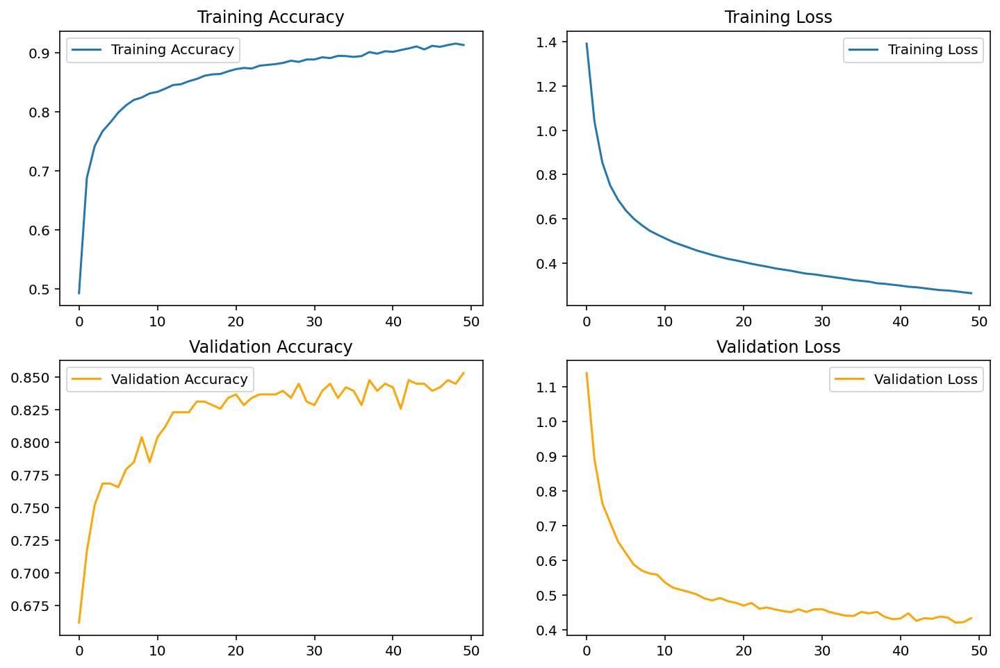

In [28]:
# 학습 단계에 따른 정확도 변화를 그래프로 확인
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

#epochs_range = range(EPOCHS)
#early_stopping 설정으로 인해 error가 발생해서 수정.
epochs_range = range(len(acc))

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)  
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.legend()
plt.title('Training Accuracy')

plt.subplot(2, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.legend()
plt.title('Training Loss')

plt.subplot(2, 2, 3)
plt.plot(epochs_range, val_acc, label='Validation Accuracy', color = 'orange')
plt.legend()
plt.title('Validation Accuracy')

plt.subplot(2, 2, 4)
plt.plot(epochs_range, val_loss, label='Validation Loss', color = 'orange')
plt.legend()
plt.title('Validation Loss')
plt.show()

약간 불안정하긴 하지만 val 그래프도 잘 학습되고 있음

In [29]:
# 32개 test sample에 대한 예측 결과 확인
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[2.45942664e-03, 1.29906042e-02, 8.78589392e-01, 6.47107465e-03,
        9.94894430e-02],
       [9.99969721e-01, 2.92120531e-05, 1.91753227e-08, 1.93548885e-07,
        8.17998909e-07],
       [6.78601325e-01, 1.36193365e-01, 8.97683855e-03, 1.63286135e-01,
        1.29423440e-02],
       [1.48065490e-04, 6.09285722e-04, 5.16097784e-01, 4.01543279e-04,
        4.82743323e-01],
       [7.84369648e-01, 1.99160606e-01, 2.83867237e-03, 6.50800671e-03,
        7.12304702e-03],
       [9.79461968e-01, 1.40416492e-02, 5.09445381e-04, 5.89188095e-03,
        9.50345202e-05],
       [1.59800402e-03, 5.28077129e-04, 9.71262634e-01, 1.57770067e-02,
        1.08341686e-02],
       [3.32338125e-01, 6.54631555e-01, 7.01311801e-05, 1.24329012e-02,
        5.27193653e-04],
       [7.19768810e-04, 2.96615544e-05, 5.47277089e-03, 9.84367192e-01,
        9.41048842e-03],
       [9.99930620e-01, 6.82158789e-05, 3.26455520e-08, 9.86808914e-07,
        1.02104231e-07],
       [9.84500289e-01, 1.3909

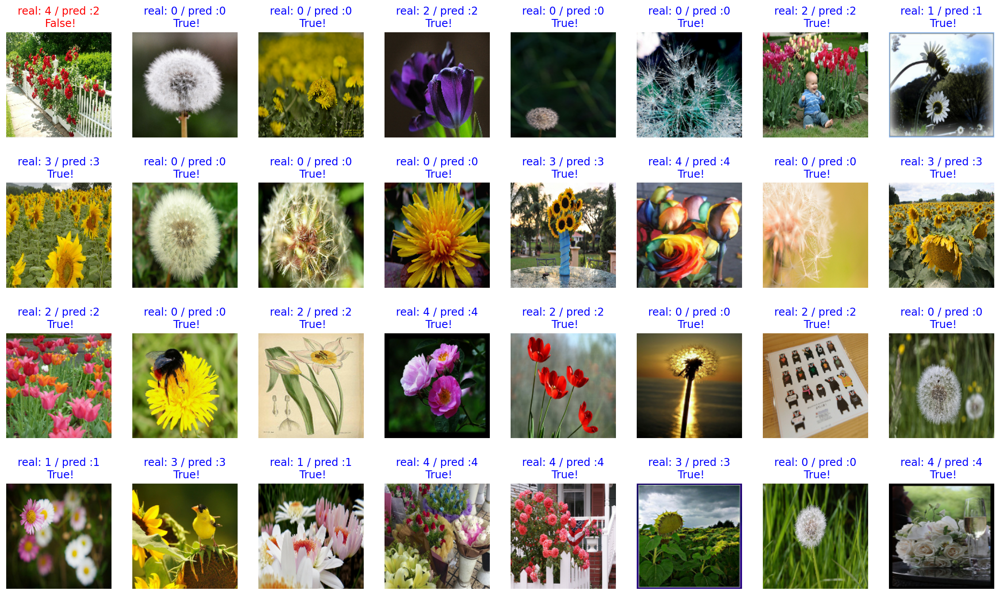

In [30]:
# prediction 값들을 실제 추론한 라벨로 변환
import numpy as np
predictions = np.argmax(predictions, axis=1)

plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [31]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100)

96.875


32개 중에서는 장미 하나를 튤립으로 예측하여 틀렸지만, 약 97%의 확률로 맞췄다.  
그러나 아직 val.acc은 85% 가량이다. 모델 성능을 올려보자.

In [32]:
# VGG 모델을 base_model의 변수로 불러오기
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')
x = base_model.output
x = tf.keras.layers.BatchNormalization()(x)  # Batch Normalization 추가
x = tf.keras.layers.GlobalAveragePooling2D()(x)  # Global Average Pooling 층 추가
x = tf.keras.layers.Dense(512, activation='relu', kernel_regularizer=l2(0.01))(x)  # 새 Dense 층 추가
# x = tf.keras.layers.Dropout(0.5)(x)  # Dropout 추가, 비율은 예시로 0.5를 사용
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')(x)  # 새 출력 층 추가

# 최종 모델 만들기
model = tf.keras.Model(
    inputs = base_model.input,
    outputs = prediction_layer
)

model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

In [33]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [34]:
# 초기 손실과 정확도 값 확인
validation_steps=10
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

10/10 [==============================] - 1s 68ms/step - loss: 6.9801 - accuracy: 0.1813
initial loss: 6.98
initial accuracy: 0.18


In [35]:
# 모델 학습
EPOCHS = 50  
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches,
                    callbacks=[early_stopping])

Epoch 1/50
92/92 [==============================] - 29s 260ms/step - loss: 5.3821 - accuracy: 0.7364 - val_loss: 4.8525 - val_accuracy: 0.7847
Epoch 2/50
92/92 [==============================] - 22s 233ms/step - loss: 4.3374 - accuracy: 0.8406 - val_loss: 4.1927 - val_accuracy: 0.7384
Epoch 3/50
92/92 [==============================] - 22s 231ms/step - loss: 3.4960 - accuracy: 0.8896 - val_loss: 4.2356 - val_accuracy: 0.7057
Epoch 4/50
92/92 [==============================] - 22s 231ms/step - loss: 2.7762 - accuracy: 0.9166 - val_loss: 2.6869 - val_accuracy: 0.8747
Epoch 5/50
92/92 [==============================] - 22s 232ms/step - loss: 2.1643 - accuracy: 0.9278 - val_loss: 2.9058 - val_accuracy: 0.7629
Epoch 6/50
92/92 [==============================] - 22s 232ms/step - loss: 1.6658 - accuracy: 0.9421 - val_loss: 1.7189 - val_accuracy: 0.8719
Epoch 7/50
92/92 [==============================] - 22s 232ms/step - loss: 1.2500 - accuracy: 0.9625 - val_loss: 1.5245 - val_accuracy: 0.8474

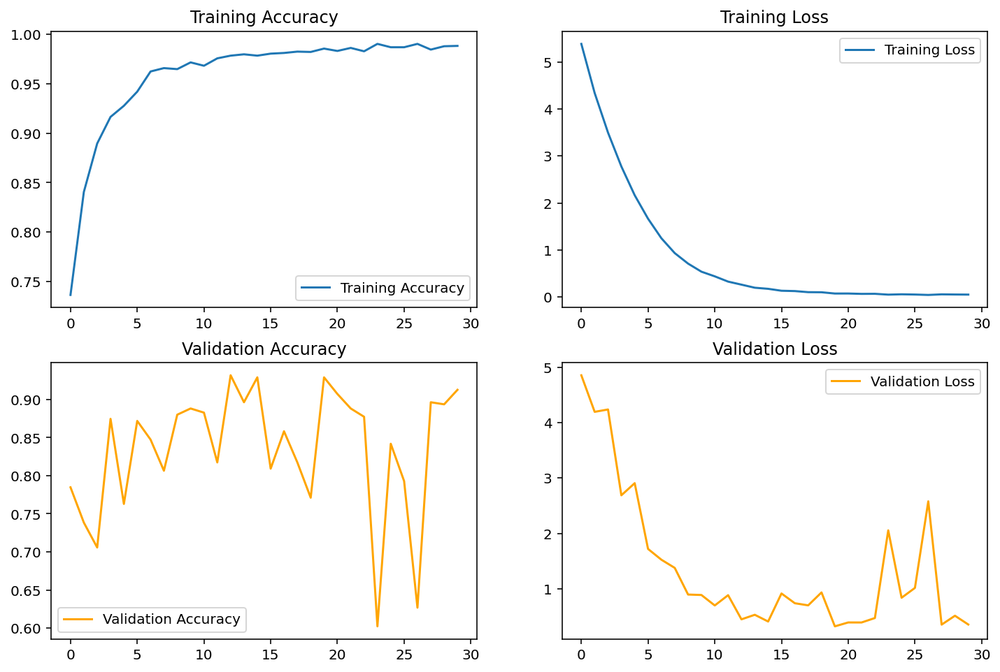

In [36]:
# 학습 단계에 따른 정확도 변화를 그래프로 확인
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

#epochs_range = range(EPOCHS)
#early_stopping 설정으로 인해 error가 발생해서 수정.
epochs_range = range(len(acc))

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)  
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.legend()
plt.title('Training Accuracy')

plt.subplot(2, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.legend()
plt.title('Training Loss')

plt.subplot(2, 2, 3)
plt.plot(epochs_range, val_acc, label='Validation Accuracy', color = 'orange')
plt.legend()
plt.title('Validation Accuracy')

plt.subplot(2, 2, 4)
plt.plot(epochs_range, val_loss, label='Validation Loss', color = 'orange')
plt.legend()
plt.title('Validation Loss')
plt.show()

의외로 규제를 가한 경우가 그렇지 않은 경우보다 더 성능이 좋지 않았다.  
다른 모델도 사용해보자.



### __[ResNet 모델 사용 (ResNet50)]__

In [37]:
# VGG 모델을 base_model의 변수로 불러오기
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

base_model = tf.keras.applications.ResNet50(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

# 모델 구조 확인
base_model.summary()

feature_batch = base_model(image_batch)
feature_batch.shape

94781440/94765736 [==============================] - 1s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 166, 166, 3)  0           input_3[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 80, 80, 64)   9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 80, 80, 64)   256         conv1_conv[0][0]                 
__________________________

TensorShape([32, 5, 5, 2048])

In [38]:
# Global Average Pooling 계층 만들기
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

# global_average_layer에 위에서 ResNet50이 출력했던 feature_batch를 입력
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

dense_layer = Dense(units=2048, activation='relu')
prediction_layer = Dense(units=5, activation='softmax')

prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

base_model.trainable = False

model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

model.summary()

(32, 2048)
(32, 5)
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Functional)        (None, 5, 5, 2048)        23587712  
_________________________________________________________________
global_average_pooling2d_2 ( (None, 2048)              0         
_________________________________________________________________
dense_6 (Dense)              (None, 2048)              4196352   
_________________________________________________________________
dense_7 (Dense)              (None, 5)                 10245     
Total params: 27,794,309
Trainable params: 4,206,597
Non-trainable params: 23,587,712
_________________________________________________________________


In [39]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [40]:
# 초기 손실과 정확도 값 확인
validation_steps=10
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

10/10 [==============================] - 2s 51ms/step - loss: 1.7905 - accuracy: 0.1406
initial loss: 1.79
initial accuracy: 0.14


In [41]:
# 모델 학습
EPOCHS = 50   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches, 
                    callbacks=[early_stopping])

Epoch 1/50
92/92 [==============================] - 10s 79ms/step - loss: 1.4471 - accuracy: 0.3835 - val_loss: 1.3563 - val_accuracy: 0.4932
Epoch 2/50
92/92 [==============================] - 7s 67ms/step - loss: 1.3366 - accuracy: 0.4622 - val_loss: 1.2769 - val_accuracy: 0.5232
Epoch 3/50
92/92 [==============================] - 7s 67ms/step - loss: 1.2775 - accuracy: 0.4918 - val_loss: 1.2573 - val_accuracy: 0.5014
Epoch 4/50
92/92 [==============================] - 7s 68ms/step - loss: 1.2297 - accuracy: 0.5228 - val_loss: 1.2141 - val_accuracy: 0.5477
Epoch 5/50
92/92 [==============================] - 7s 68ms/step - loss: 1.2012 - accuracy: 0.5307 - val_loss: 1.2260 - val_accuracy: 0.5177
Epoch 6/50
92/92 [==============================] - 7s 68ms/step - loss: 1.1649 - accuracy: 0.5477 - val_loss: 1.1780 - val_accuracy: 0.5395
Epoch 7/50
92/92 [==============================] - 7s 67ms/step - loss: 1.1433 - accuracy: 0.5681 - val_loss: 1.1922 - val_accuracy: 0.5177
Epoch 8/50
9

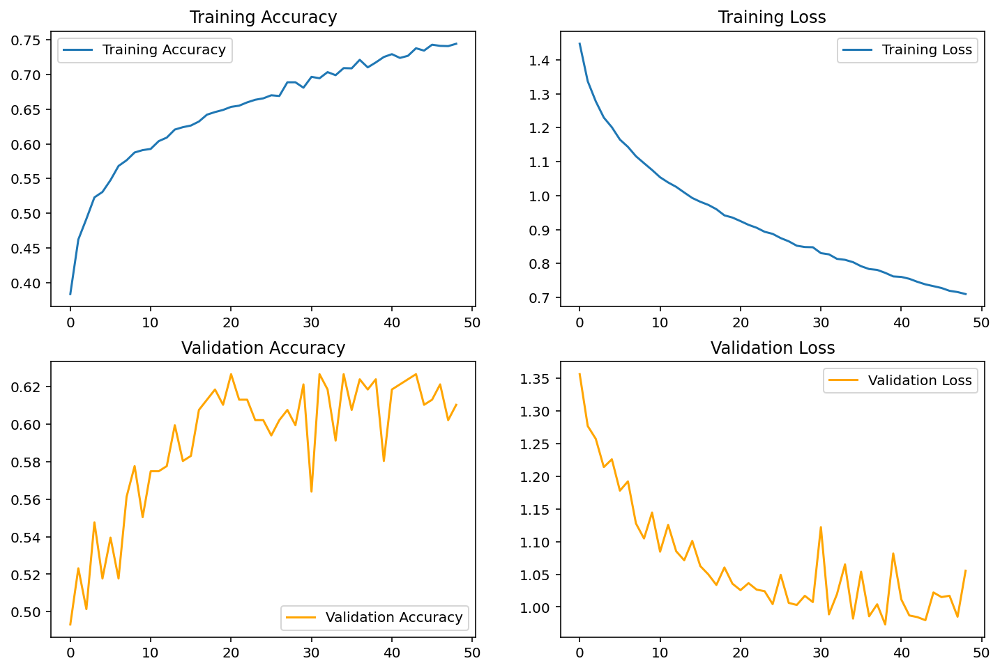

In [42]:
# 학습 단계에 따른 정확도 변화를 그래프로 확인
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

#epochs_range = range(EPOCHS)
#early_stopping 설정으로 인해 error가 발생해서 수정.
epochs_range = range(len(acc))

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)  
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.legend()
plt.title('Training Accuracy')

plt.subplot(2, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.legend()
plt.title('Training Loss')

plt.subplot(2, 2, 3)
plt.plot(epochs_range, val_acc, label='Validation Accuracy', color = 'orange')
plt.legend()
plt.title('Validation Accuracy')

plt.subplot(2, 2, 4)
plt.plot(epochs_range, val_loss, label='Validation Loss', color = 'orange')
plt.legend()
plt.title('Validation Loss')
plt.show()

ResNet이 VGG16보다 성능은 좋지 않았다.